# Clothes Classification with Support Vector Machines

In this notebook we are going to explore the use of Support Vector Machines (SVM) for image classification. We will use a new version of the famous MNIST dataset (the original is a dataset of handwritten digits). The version we are going to use is called Fashion MNIST (https://pravarmahajan.github.io/fashion/) and is a dataset of small images of clothes and accessories.



The dataset labels are the following:

| Label | Description |
| --- | --- |
| 0 | T-shirt/top |
| 1 | Trouser |
| 2 | Pullover |
| 3 | Dress |
| 4 | Coat |
| 5 | Sandal |
| 6 | Shirt |
| 7 | Sneaker |
| 8 | Bag |
| 9 | Ankle boot |

## TODO: Insert your surname, name and ID number

Student surname: Domenichetti

Student name: Lorenzo
    
ID: 2011653

In [1]:
#load the required packages

%matplotlib inline  

import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import pandas as pd

import sklearn
from sklearn.datasets import fetch_openml
from sklearn.neural_network import MLPClassifier
from sklearn.decomposition import PCA
import sklearn.metrics as skm

In [2]:
# helper function to load Fashion MNIST dataset
def load_mnist(path, kind='train'):
    import os
    import gzip
    import numpy as np
    labels_path = os.path.join(path, '%s-labels-idx1-ubyte.gz' % kind)
    images_path = os.path.join(path, '%s-images-idx3-ubyte.gz' % kind)
    with gzip.open(labels_path, 'rb') as lbpath:
        labels = np.frombuffer(lbpath.read(), dtype=np.uint8,offset=8)
    with gzip.open(images_path, 'rb') as imgpath:
        images = np.frombuffer(imgpath.read(), dtype=np.uint8,offset=16).reshape(len(labels), 784)
    return images, labels

In [3]:
#fix your ID ("numero di matricola") and the seed for random generator (as usual you can try different seeds)
ID = 2011653
np.random.seed(ID)

In [4]:
#load the Fashion MNIST dataset from the 'data' folder and let's normalize the features so that each value is in [0,1] 

X, y = load_mnist('data', kind='train')
# rescale the data
X, y = X / 255., y # original pixel values are between 0 and 255
print(X.shape, y.shape)

(60000, 784) (60000,)


Now split into training and test. Make sure that each label is present at least 10 times
in training. If it is not, then keep adding permutations to the initial data until this 
happens.

In [5]:
# Random permute the data and split into training and test taking the first 600
# data samples as training and 4000 samples as test
permutation = np.random.permutation(X.shape[0])

X = X[permutation]
y = y[permutation]

m_training = 600
m_test = 4000

X_train, X_test = X[:m_training], X[m_training:m_training+m_test:]
y_train, y_test = y[:m_training], y[m_training:m_training+m_test:]

labels, freqs = np.unique(y_train, return_counts=True)
print("Labels in training dataset: ", labels)
print("Frequencies in training dataset: ", freqs)

Labels in training dataset:  [0 1 2 3 4 5 6 7 8 9]
Frequencies in training dataset:  [68 47 78 50 52 67 71 61 50 56]


In [6]:
#function for plotting a image and printing the corresponding label
def plot_input(X_matrix, labels, index):
    print("INPUT:")
    plt.imshow(
        X_matrix[index].reshape(28,28),
        cmap          = plt.cm.gray_r,
        interpolation = "nearest"
    )
    plt.show()
    print("LABEL: %i"%labels[index])
    return

INPUT:


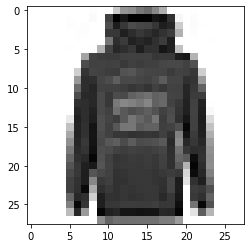

LABEL: 2
INPUT:


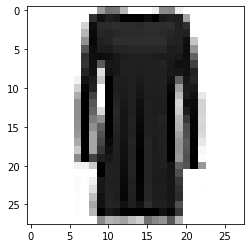

LABEL: 3
INPUT:


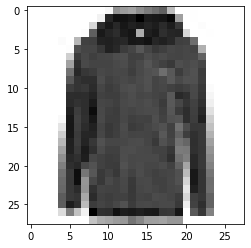

LABEL: 4
INPUT:


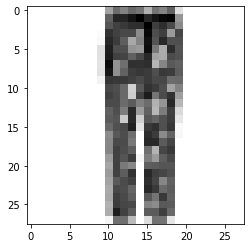

LABEL: 1


In [7]:
#let's try the plotting function
plot_input(X_train,y_train,5)
plot_input(X_test,y_test,50)
plot_input(X_test,y_test,500)
plot_input(X_test,y_test,700)

## TO DO 1
Use a SVM classifier with cross validation to pick a model. Use a 4-fold cross-validation. Let's start with a Linear kernel:

In [8]:
#import SVC
import pandas as pd
from IPython.display import display, HTML
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

In [9]:
# parameters for linear SVM
parameters = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}

#train linear SVM

clf = GridSearchCV( estimator = SVC(kernel = 'linear'), param_grid = parameters, cv = 4)
clf.fit(X_train, y_train)

print(f"Check 4 fold validation: {clf.n_splits_ == 4}\n")

res = pd.DataFrame(clf.cv_results_)
print (f'RESULTS FOR LINEAR KERNEL\n')
print (f'{display(HTML(res.to_html()))}\n')

print(f"Best parameters set found: {clf.best_params_}\n")

print(f"Score with best parameters: {clf.best_score_}\n")

print("All scores on the grid:\n")

print(f"{res[['param_C', 'mean_test_score']]}")

Check 4 fold validation: True

RESULTS FOR LINEAR KERNEL



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.330171,0.034979,0.090275,0.017056,0.001,{'C': 0.001},0.580000,0.520000,0.506667,0.520000,0.531667,0.028431,6
1,0.159766,0.022184,0.055206,0.001318,0.01,{'C': 0.01},0.733333,0.733333,0.780000,0.666667,0.728333,0.040380,2
2,0.119144,0.001958,0.048775,0.000553,0.1,{'C': 0.1},0.760000,0.720000,0.766667,0.726667,0.743333,0.020276,1
3,0.127813,0.000593,0.049081,0.000721,1,{'C': 1},0.726667,0.706667,0.740000,0.720000,0.723333,0.012019,3
4,0.126750,0.001157,0.048699,0.000635,10,{'C': 10},0.726667,0.706667,0.740000,0.720000,0.723333,0.012019,3
5,0.126232,0.000920,0.048647,0.000519,100,{'C': 100},0.726667,0.706667,0.740000,0.720000,0.723333,0.012019,3


None

Best parameters set found: {'C': 0.1}

Score with best parameters: 0.7433333333333333

All scores on the grid:

  param_C  mean_test_score
0   0.001         0.531667
1    0.01         0.728333
2     0.1         0.743333
3       1         0.723333
4      10         0.723333
5     100         0.723333


## TO DO 2
Pick a model for the Polynomial kernel with degree=2:

In [10]:
# parameters for poly with degree 2 kernel
parameters = {'C': [0.05, 0.5, 5],'gamma':[0.05,0.5,5.]}

#run SVM with poly of degree 2 kernel

clf_2 = GridSearchCV( estimator = SVC(kernel = 'linear', degree=2), param_grid = parameters, cv = 4)
clf_2.fit(X_train, y_train)

print ('RESULTS FOR POLY DEGREE=2 KERNEL\n')
res = pd.DataFrame(clf_2.cv_results_)

print (f'{display(HTML(res.to_html()))}\n')

print(f"Best parameters set found: {clf_2.best_params_}")

print(f"Score with best parameters: {clf_2.best_score_}")

print("All scores on the grid:")

print(f"{res[['param_C', 'param_gamma', 'mean_test_score']]}")

RESULTS FOR POLY DEGREE=2 KERNEL



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.118814,0.006418,0.048249,0.001972,0.05,0.05,"{'C': 0.05, 'gamma': 0.05}",0.733333,0.733333,0.773333,0.726667,0.741667,0.018484,1
1,0.115347,0.001951,0.046942,0.000662,0.05,0.5,"{'C': 0.05, 'gamma': 0.5}",0.733333,0.733333,0.773333,0.726667,0.741667,0.018484,1
2,0.116326,0.002339,0.047310,0.000849,0.05,5,"{'C': 0.05, 'gamma': 5.0}",0.733333,0.733333,0.773333,0.726667,0.741667,0.018484,1
3,0.134820,0.010896,0.056333,0.013592,0.5,0.05,"{'C': 0.5, 'gamma': 0.05}",0.720000,0.720000,0.733333,0.733333,0.726667,0.006667,4
4,0.124233,0.001678,0.048829,0.000649,0.5,0.5,"{'C': 0.5, 'gamma': 0.5}",0.720000,0.720000,0.733333,0.733333,0.726667,0.006667,4
5,0.125845,0.002860,0.048629,0.001046,0.5,5,"{'C': 0.5, 'gamma': 5.0}",0.720000,0.720000,0.733333,0.733333,0.726667,0.006667,4
6,0.123513,0.000923,0.048399,0.001037,5,0.05,"{'C': 5, 'gamma': 0.05}",0.726667,0.706667,0.740000,0.720000,0.723333,0.012019,7
7,0.123867,0.000977,0.047918,0.000353,5,0.5,"{'C': 5, 'gamma': 0.5}",0.726667,0.706667,0.740000,0.720000,0.723333,0.012019,7
8,0.123945,0.001377,0.047886,0.000304,5,5,"{'C': 5, 'gamma': 5.0}",0.726667,0.706667,0.740000,0.720000,0.723333,0.012019,7


None

Best parameters set found: {'C': 0.05, 'gamma': 0.05}
Score with best parameters: 0.7416666666666666
All scores on the grid:
  param_C param_gamma  mean_test_score
0    0.05        0.05         0.741667
1    0.05         0.5         0.741667
2    0.05           5         0.741667
3     0.5        0.05         0.726667
4     0.5         0.5         0.726667
5     0.5           5         0.726667
6       5        0.05         0.723333
7       5         0.5         0.723333
8       5           5         0.723333


## TO DO 3

Now let's try a higher degree for the polynomial kernel (e.g., 4th degree).

In [11]:
# parameters for poly with higher degree kernel
parameters = {'C': [0.05, 0.5, 5],'gamma':[0.05,0.5,5.]}

#run SVM with poly of higher degree kernel
degree = 4

clf_4= GridSearchCV( estimator = SVC(kernel = 'linear', degree=degree), param_grid = parameters, cv = 4)
clf_4.fit(X_train, y_train)

print ('RESULTS FOR POLY DEGREE=4 KERNEL\n')
res = pd.DataFrame(clf_4.cv_results_)

print (f'{display(HTML(res.to_html()))}')

print(f"Best parameters set found: {clf_4.best_params_}")

print(f"Score with best parameters: {clf_4.best_score_}")

print("All scores on the grid:")

print(f"{res[['param_C', 'param_gamma', 'mean_test_score']]}")

RESULTS FOR POLY DEGREE=4 KERNEL



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.126002,0.007810,0.049983,0.000870,0.05,0.05,"{'C': 0.05, 'gamma': 0.05}",0.733333,0.733333,0.773333,0.726667,0.741667,0.018484,1
1,0.121297,0.003013,0.049214,0.000678,0.05,0.5,"{'C': 0.05, 'gamma': 0.5}",0.733333,0.733333,0.773333,0.726667,0.741667,0.018484,1
2,0.117987,0.004998,0.047458,0.000355,0.05,5,"{'C': 0.05, 'gamma': 5.0}",0.733333,0.733333,0.773333,0.726667,0.741667,0.018484,1
3,0.123707,0.002167,0.047601,0.000681,0.5,0.05,"{'C': 0.5, 'gamma': 0.05}",0.720000,0.720000,0.733333,0.733333,0.726667,0.006667,4
4,0.123704,0.002091,0.047832,0.000755,0.5,0.5,"{'C': 0.5, 'gamma': 0.5}",0.720000,0.720000,0.733333,0.733333,0.726667,0.006667,4
5,0.123986,0.001893,0.047769,0.000960,0.5,5,"{'C': 0.5, 'gamma': 5.0}",0.720000,0.720000,0.733333,0.733333,0.726667,0.006667,4
6,0.122737,0.000577,0.048047,0.000434,5,0.05,"{'C': 5, 'gamma': 0.05}",0.726667,0.706667,0.740000,0.720000,0.723333,0.012019,7
7,0.123535,0.000269,0.047361,0.000268,5,0.5,"{'C': 5, 'gamma': 0.5}",0.726667,0.706667,0.740000,0.720000,0.723333,0.012019,7
8,0.123111,0.001986,0.047708,0.000665,5,5,"{'C': 5, 'gamma': 5.0}",0.726667,0.706667,0.740000,0.720000,0.723333,0.012019,7


None
Best parameters set found: {'C': 0.05, 'gamma': 0.05}
Score with best parameters: 0.7416666666666666
All scores on the grid:
  param_C param_gamma  mean_test_score
0    0.05        0.05         0.741667
1    0.05         0.5         0.741667
2    0.05           5         0.741667
3     0.5        0.05         0.726667
4     0.5         0.5         0.726667
5     0.5           5         0.726667
6       5        0.05         0.723333
7       5         0.5         0.723333
8       5           5         0.723333


## TO DO 4
Pick a model for the Radial Basis Function kernel:

In [12]:
# parameters for rbf SVM
parameters = {'C': [0.5, 5, 50, 500],'gamma':[0.005, 0.05, 0.5,5]}

#run SVM with rbf kernel

clf_rbf = GridSearchCV( estimator = SVC(kernel = 'rbf'), param_grid = parameters, cv = 4)
clf_rbf.fit(X_train, y_train)

print ('RESULTS FOR RBF KERNEL\n')
res = pd.DataFrame(clf_rbf.cv_results_)

print (f'{display(HTML(res.to_html()))}')

print(f"Best parameters set found: {clf_rbf.best_params_}")

print(f"Score with best parameters: {clf_rbf.best_score_}")

print("All scores on the grid:")

print(f"{res[['param_C', 'param_gamma', 'mean_test_score']]}")

RESULTS FOR RBF KERNEL



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.207367,0.006220,0.060035,0.000495,0.5,0.005,"{'C': 0.5, 'gamma': 0.005}",0.680000,0.660000,0.626667,0.640000,0.651667,0.020207,7
1,0.339614,0.003024,0.063255,0.000512,0.5,0.05,"{'C': 0.5, 'gamma': 0.05}",0.660000,0.586667,0.593333,0.593333,0.608333,0.029954,8
2,0.364948,0.000382,0.065489,0.000354,0.5,0.5,"{'C': 0.5, 'gamma': 0.5}",0.126667,0.126667,0.133333,0.133333,0.130000,0.003333,9
3,0.370618,0.000750,0.068565,0.000602,0.5,5,"{'C': 0.5, 'gamma': 5}",0.126667,0.126667,0.133333,0.133333,0.130000,0.003333,9
4,0.142908,0.001102,0.052060,0.001173,5,0.005,"{'C': 5, 'gamma': 0.005}",0.753333,0.766667,0.766667,0.693333,0.745000,0.030322,3
5,0.355142,0.001446,0.062821,0.000849,5,0.05,"{'C': 5, 'gamma': 0.05}",0.746667,0.713333,0.720000,0.693333,0.718333,0.019076,4
6,0.368110,0.001029,0.065448,0.000164,5,0.5,"{'C': 5, 'gamma': 0.5}",0.126667,0.126667,0.133333,0.133333,0.130000,0.003333,9
7,0.373613,0.000548,0.068570,0.000345,5,5,"{'C': 5, 'gamma': 5}",0.126667,0.126667,0.133333,0.133333,0.130000,0.003333,9
8,0.152792,0.003551,0.052281,0.000162,50,0.005,"{'C': 50, 'gamma': 0.005}",0.753333,0.766667,0.746667,0.720000,0.746667,0.016997,1
9,0.355546,0.001334,0.062274,0.000554,50,0.05,"{'C': 50, 'gamma': 0.05}",0.746667,0.713333,0.720000,0.693333,0.718333,0.019076,4


None
Best parameters set found: {'C': 50, 'gamma': 0.005}
Score with best parameters: 0.7466666666666666
All scores on the grid:
   param_C param_gamma  mean_test_score
0      0.5       0.005         0.651667
1      0.5        0.05         0.608333
2      0.5         0.5         0.130000
3      0.5           5         0.130000
4        5       0.005         0.745000
5        5        0.05         0.718333
6        5         0.5         0.130000
7        5           5         0.130000
8       50       0.005         0.746667
9       50        0.05         0.718333
10      50         0.5         0.130000
11      50           5         0.130000
12     500       0.005         0.746667
13     500        0.05         0.718333
14     500         0.5         0.130000
15     500           5         0.130000


## QUESTION 1
What do you observe when using linear, polynomial and RBF kernels on this dataset ?

The best scores are quite constant, and all different kernels have similar performances. Furthermore, we can observe that all polynomial kernels have regular performances while varying both parameters C and gamma (apart from a single outlier case in the linear kernel with the smallest value of C). So, within the given ranges, we can say their performance is slightly affected by parameters. On the other hand, gaussian kernel results strongly depend on the parameters. In fact, increasing the gamma parameter, we are probably overfitting the data(see also following figures): as shown in the results sheet, sometimes RBF yields very bad scores on the validation fold (linked in particular to high gamma values, which is related to small gaussians variances - leading to overfitting issues), even if with on-target parameters it yields the best score.


## TO DO 5
Report here the best SVM kernel and parameters

In [13]:
#get training and test error for the best SVM model from CV

best_SVM = SVC(kernel = 'rbf', C = 50, gamma = 0.005 )

best_SVM.fit(X_train, y_train)

training_error = 1.-best_SVM.score(X_train, y_train)
test_error = 1.-best_SVM.score(X_test, y_test)

# (error is 1 - svm.score)
print ("Best SVM training error: %f" % training_error)
print ("Best SVM test error: %f" % test_error)

Best SVM training error: 0.000000
Best SVM test error: 0.196500


## TO DO 6

Analyze how the classification boundaries depend on the C parameter

In [14]:
# Function to plot the data and classification boundaries. 


def plot_data(model, X_train, y_train, X_test, y_test, train_error, test_error):
    
    def make_meshgrid(x, y, h=.02):
        x_min, x_max = x.min() - abs(0.1*x.min()), x.max() + abs(0.1*x.min())
        y_min, y_max = y.min() - abs(0.1*y.min()), y.max() + abs(0.1*y.min())
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
        return xx, yy

    def plot_contours(ax, clf, xx, yy, **params):
        Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
        Z = Z.reshape(xx.shape)
        out = ax.contourf(xx, yy, Z, **params)
        return out
    
    
    
    # Plot
    fig, ax = plt.subplots(1,2,figsize=(15,5))

    # Training set
    X0, X1 = X_train_pca[:, 0], X_train_pca[:, 1]
    xx, yy = make_meshgrid(X0, X1)
    plot_contours(ax[0], model, xx, yy, cmap=plt.cm.coolwarm, alpha=0.8)
    ax[0].scatter(X0, X1, c=y_train, cmap=plt.cm.coolwarm, s=35, edgecolors='k')
    ax[0].set_xticks(())
    ax[0].set_yticks(())
    ax[0].set_title('Training data, C={:.0e}, model accuracy={:.3f}'.format(model.__dict__['C'],train_error))
    
    # Test set
    X0, X1 = X_test_pca[:, 0], X_test_pca[:, 1]
    xx, yy = make_meshgrid(X0, X1)
    plot_contours(ax[1], model, xx, yy, cmap=plt.cm.coolwarm, alpha=0.8)
    ax[1].scatter(X0, X1, c=y_test, cmap=plt.cm.coolwarm, s=35, edgecolors='k')
    ax[1].set_xticks(())
    ax[1].set_yticks(())
    ax[1].set_title('Test data, C={:.0e}, model accuracy={:.3f}'.format(model.__dict__['C'],test_error))
    
    plt.show()

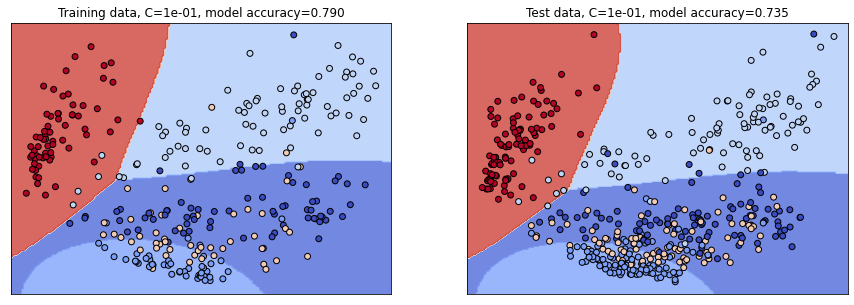

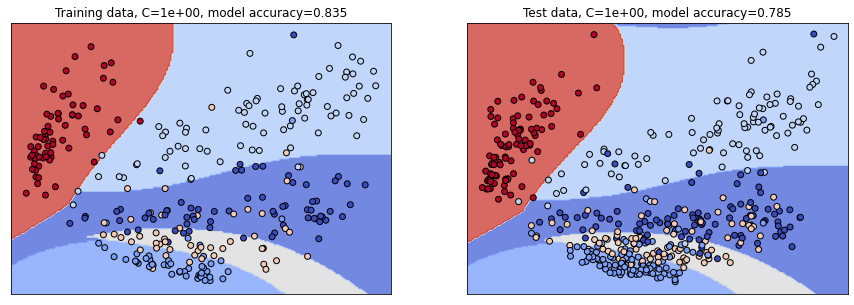

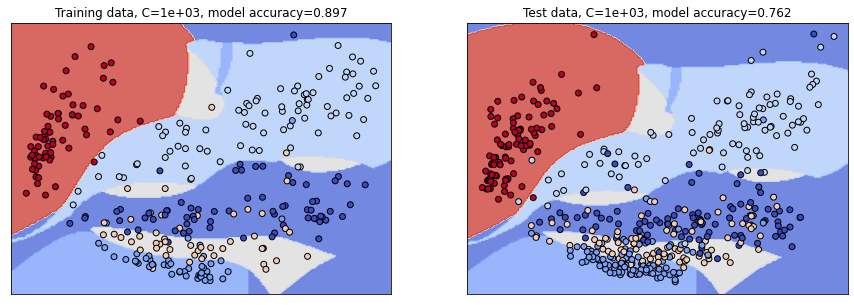

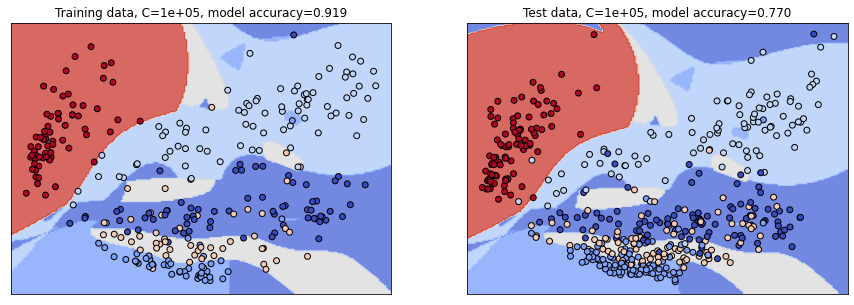

In [15]:
# Too many test samples for visualization, plot only some of them
m_test = 1000
p = np.random.permutation(X_test.shape[0])[:m_test]
X_test_red, y_test_red = X_test[p,:], y_test[p]

# Perform classification only on subset of original classes for better visualization

class_list = [0,1,2,3,5] #YOU CAN TRY TO CHANGE THE CLASSES

train_idxs = [i for i in range(len(y_train)) if y_train[i] in class_list]   
test_idxs = [i for i in range(len(y_test_red)) if y_test_red[i] in class_list] 
X_train_plot = X_train[train_idxs,:]
X_test_plot = X_test_red[test_idxs,:] 
y_train_plot = y_train[train_idxs]
y_test_plot = y_test_red[test_idxs] 


# The dimensionality is reduced to 2 for visualization using PCA
# PCA: Reduce the dimensionality trying to preserve the information content. 
# PCA will be the topic of one of the very last lectures

# Reduce X dimensionality to 2 for visualization
pca = PCA(n_components=2, svd_solver='randomized', whiten=True).fit(X_train)
X_train_pca, X_test_pca = pca.transform(X_train_plot), pca.transform(X_test_plot)


C_list = [1e-1, 1, 1e3, 1e5]
gamma = 0.5

# Fit the prediction model on train_plot data futher reduced with PCA, 
# then classify with different prediction models and plot data
# Use RBF kernel 

for C in C_list:
    # ADD CODE TO TRAIN SVM (use the PCA reduced data)
    my_svm = SVC(kernel="rbf", C = C, gamma = gamma )
    
    my_svm.fit(X_train_pca, y_train_plot)

    train_error, test_error = 1-my_svm.score(X_train_pca, y_train_plot), 1-my_svm.score(X_test_pca, y_test_plot)

    plot_data(my_svm, X_train_pca, y_train_plot, X_test_pca, y_test_plot, 1-train_error, 1-test_error)

## QUESTION 2
How do the shape of the boundaries changes when trying different values of C ?

Boundaries get more and more complicated as C increases. With very large Cs it can be clearly seen that the shapes move accordingly to small clusters of training samples, which may lead to an overfitting predictor. In the top figure, instead, a simple predictor is shown. In some cases, due to the overlapping of points associated to similar clothes (e.g. t-shirts and shirts) it does not manage to classify the data properly.
Anyway, we can observe that the train accuracy decreases with bigger values of C, but on the other hand the test one decreases due to overfitting problems. 
P.S. In some other unlucky cases ,e.g. choosing [0,1,2,3,4] as clothes represented, it is possible to find not-decreasing test accuracies. In any case, the complexity of the boundaries is suggesting us not to choose greater C values, which would lead to unstable predictors. 
(In few words, better to use some regularization than not).

## TO DO 7

Analyze how the gamma parameter (inversely proportional to standard deviation of Gaussian Kernel) impact the performances of the classifier

In [16]:
#Test with different values of gamma
# Setting gamma values
gamma_values = np.logspace(-5,2,8)
print(gamma_values)

[1.e-05 1.e-04 1.e-03 1.e-02 1.e-01 1.e+00 1.e+01 1.e+02]


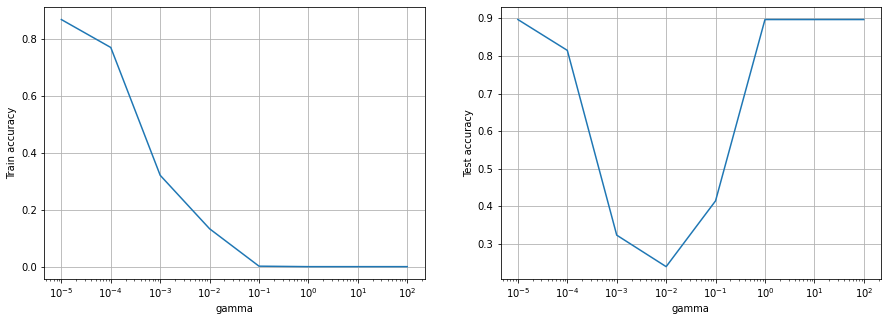

In [17]:
# Try the SVM with the previously set values of gamma
# use rbf kernel and C=1

train_acc_list, test_acc_list = [], []


for gamma in gamma_values:
    my_svm = SVC(kernel="rbf", C = 1, gamma = gamma)
    
    my_svm.fit(X_train, y_train)

    train_acc_list.append(1-my_svm.score(X_train, y_train))
    test_acc_list.append(1-my_svm.score(X_test, y_test))

# Plot
fig, ax = plt.subplots(1,2, figsize=(15,5))

ax[0].plot(gamma_values, train_acc_list)
ax[0].set_xscale('log')
ax[0].set_xlabel('gamma')
ax[0].set_ylabel('Train accuracy')
ax[0].grid(True)

ax[1].plot(gamma_values, test_acc_list)
ax[1].set_xscale('log')
ax[1].set_xlabel('gamma')
ax[1].set_ylabel('Test accuracy')
ax[1].grid(True)


plt.show()

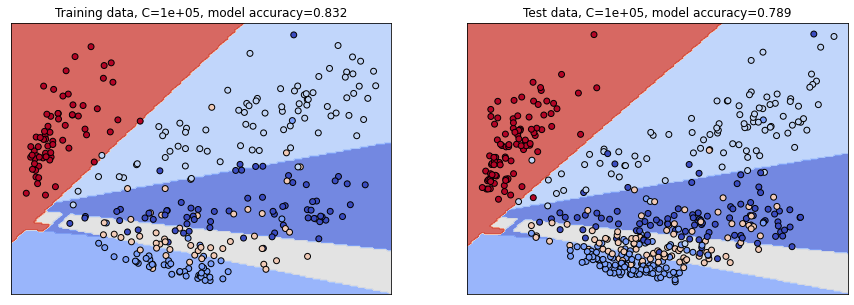

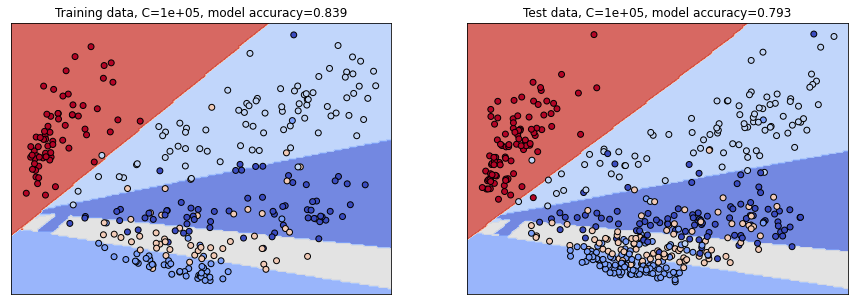

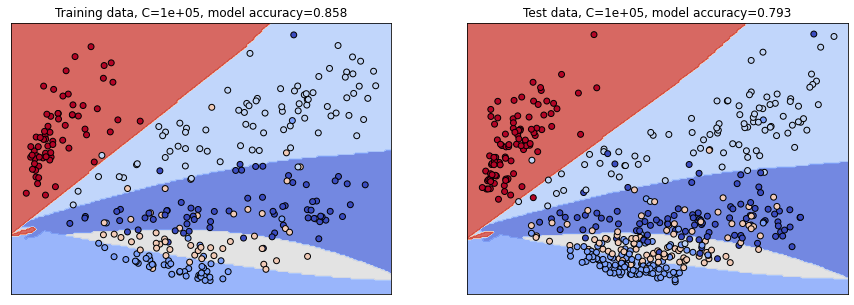

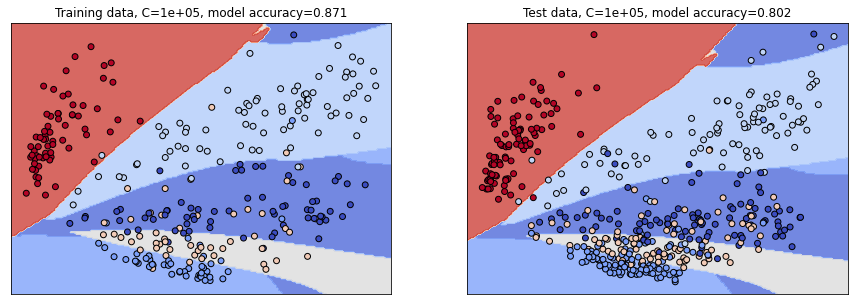

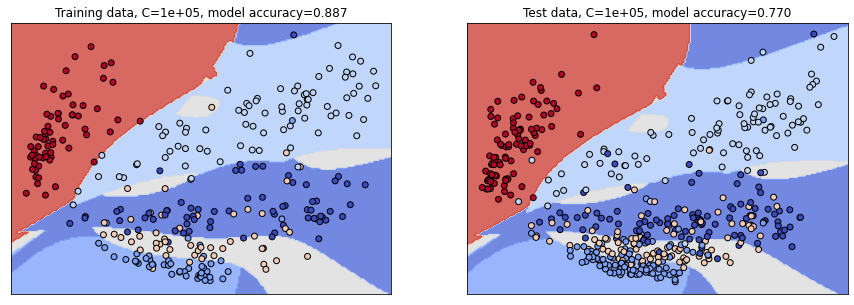

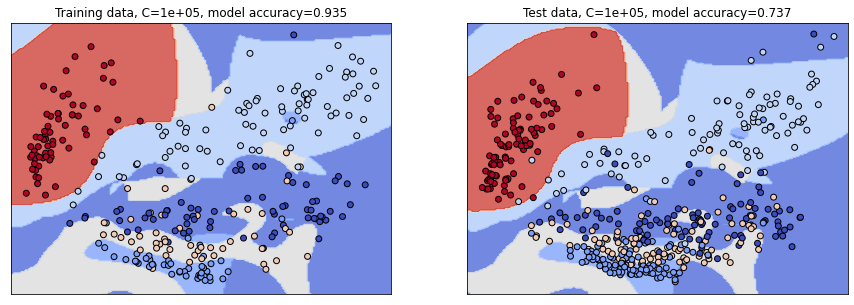

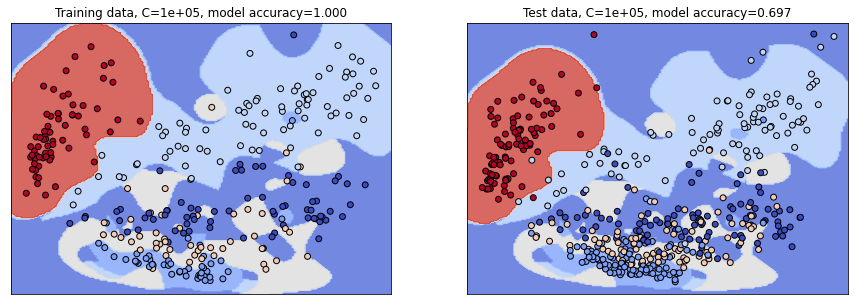

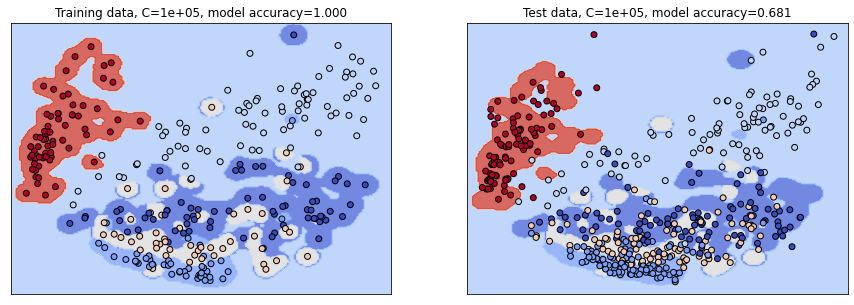

In [18]:

C_list = [1e-1, 1, 1e3, 1e5]
gamma = 0.5

# Fit the prediction model on train_plot data futher reduced with PCA, 
# then classify with different prediction models and plot data
# Use RBF kernel 

for gam_iter in gamma_values:
    # ADD CODE TO TRAIN SVM (use the PCA reduced data)
    my_svm = SVC(kernel="rbf", C = C, gamma = gam_iter )
    
    my_svm.fit(X_train_pca, y_train_plot)

    train_error, test_error = 1-my_svm.score(X_train_pca, y_train_plot), 1-my_svm.score(X_test_pca, y_test_plot)

    plot_data(my_svm, X_train_pca, y_train_plot, X_test_pca, y_test_plot, 1-train_error, 1-test_error) 

 ## QUESTION 3
How do the train and test error change when changing $\gamma$? Which is the best value of $\gamma$ ? 
Connect your answers to the discussion about the overfitting issue.


The training error always decreases while increasing $\gamma$, managing to fit always better the data. Anyway, the test error curve has a different shape, that clearly indicates that we are overfitting our datas from a certain point on. 
In fact, if we remember that $\gamma$ is linked to the inverse of the gaussians' variance, we can suppose that during the training we are building more and more precise gaussians fitting nicely the training data, but being unable to predict coherently unknown data. (Actually written before plotting the graphs for different $\gamma$ values, but the description is pretty accurate.).

The graph on $\gamma$ errors shows the effect noticed while presentating RBF kernel results - performances are deeply affected varying the gaussians' std devs.

## More data
Now let's do the same but using more data points for training.


Choose a new number of data points.

In [19]:
X = X[permutation]
y = y[permutation]

m_training = 1500 #number of training points

X_train, X_test = X[:m_training], X[m_training:]
y_train, y_test = y[:m_training], y[m_training:]

labels, freqs = np.unique(y_train, return_counts=True)
print("Labels in training dataset: ", labels)
print("Frequencies in training dataset: ", freqs)

Labels in training dataset:  [0 1 2 3 4 5 6 7 8 9]
Frequencies in training dataset:  [138 150 149 159 130 145 152 164 147 166]


## TO DO 8

Let's try to use SVM with parameters obtained from the best model for $m_{training} =  1500$. Since it may take a long time to run, you can decide to just let it run for some time and stop it if it does not complete. If you decide to do this, report it in the cell below.

In [20]:
#get training and test error for the best SVM model from CV

best_SVM = SVC(kernel = 'rbf', C = 50, gamma = 0.005 )

best_SVM.fit(X_train, y_train)

training_error = 1-best_SVM.score(X_train, y_train)
test_error = 1-best_SVM.score(X_test, y_test)

# (error is 1 - svm.score)

print ("Best SVM training error: %f" % training_error)
print ("Best SVM test error: %f" %  test_error)

Best SVM training error: 0.000000
Best SVM test error: 0.174769


Just for comparison, let's also use logistic regression 

## TO DO 9 Try first without regularization (use a very large large C)¶

In [21]:
from sklearn import linear_model

lrm = linear_model.LogisticRegression(C=1e5)

lrm.fit(X_train, y_train)

training_error = 1-lrm.score(X_train, y_train)
test_error = 1-lrm.score(X_test, y_test)
print ("Best logistic regression training error: %f" % training_error)
print ("Best logistic regression test error: %f" % test_error)

Best logistic regression training error: 0.000000
Best logistic regression test error: 0.234821


## TO DO 10 Try  with regularization (use C=1)¶

In [22]:
lrm = linear_model.LogisticRegression(C=1)

lrm.fit(X_train, y_train)

training_error = 1-lrm.score(X_train, y_train)
test_error = 1-lrm.score(X_test, y_test)
print ("Best regularized logistic regression training error: %f" % training_error)
print ("Best regularized logistic regression test error: %f" % test_error)

print("Enabling regularization, we are taking into account the train error AND the complexity of the predictor. Minding also the predictor complexity, we get a more stable solution - it does not have a 0 training error, but performs better on the test set (our main goal).")

Best regularized logistic regression training error: 0.014000
Best regularized logistic regression test error: 0.196137
Enabling regularization, we are taking into account the train error AND the complexity of the predictor. Minding also the predictor complexity, we get a more stable solution - it does not have a 0 training error, but performs better on the test set (our main goal).


## QUESTION 4
Compare and discuss:
- the results from SVM with m=600 and with m=1500 training data points. If you stopped the SVM, include such aspect in your comparison.

Considering the SVM results, we can observe that in both cases the training error goes to zero. Anyway, a bigger training set shows a more robust solution: in fact we get a smaller error for m=1500 training samples. The increase in performance of the RBF kernel is not negligible when we use more data (approximately, we have a 10% error reduction).

- the results of SVM and of Logistic Regression


On such small training sets, SVM and Logistic Regression do not yield much different results. Moreover, the best SVM and LR (without regularization) estimator show a null training error, while the regularized LR has a non-zero error. As stated previously, in the latter case we are not only minimizing the loss on training data, but we also take into consideration the complexity of our estimator. So, even if the latter estimator may be simpler, misclassifying more training samples, it gives a better prediction on the test set. 

## TO DO 11
Plot an item of clothing that is missclassified by logistic regression and correctly classified by SVM.

In [23]:
LR_prediction = lrm.predict(X_test)
SVM_prediction = best_SVM.predict(X_test)

INPUT:


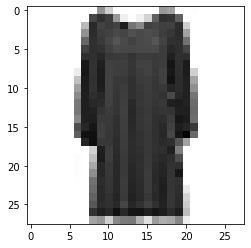

LABEL: 6
SVM_label = 6
LR_label = 3
Real_label = 6
Actually I would also say it is a dress(3), and not a shirt(6).


In [24]:
index = 0
for i in range(len(y_test)):
    if (LR_prediction[i]!=SVM_prediction[i]):
        if (SVM_prediction[i]==y_test[i]):
            index = i
            break

plot_input(X_test, y_test, index)
print(f"SVM_label = {SVM_prediction[i]}" )
print(f"LR_label = {LR_prediction[i]}" )
print(f"Real_label = {y_test[i]}")

print("Actually I would also say it is a dress(3), and not a shirt(6).")

## TO DO 12
Plot the confusion matrix for the SVM classifier and for logistic regression.
The confusion matrix has one column for each predicted label and one row for each true label. 
It shows for each class in the corresponding row how many samples belonging to that class gets each possible output label.
Notice that the diagonal contains the correctly classified samples, while the other cells correspond to errors.
You can obtain it with the sklearn.metrics.confusion_matrix function (see the documentation).
Try also to normalize the confusion matrix by the number of samples in each class in order to measure the accuracy on each single class.


In [25]:
np.set_printoptions(precision=2, suppress=True, floatmode='fixed') # for better aligned printing of confusion matrix use floatmode='fixed'

u, counts = np.unique(y_test, return_counts=True)
print("Labels and frequencies in test set: ", counts)

confusion_SVM = sklearn.metrics.confusion_matrix(y_test, SVM_prediction)
print("\n Confusion matrix SVM  \n \n", confusion_SVM)
print("\n Confusion matrix SVM (normalized)   \n \n", confusion_SVM /counts[:,None] )

confusion_LR =  sklearn.metrics.confusion_matrix(y_test, LR_prediction)
print("\n Confusion matrix LR  \n \n", confusion_LR)
print("\n Confusion matrix LR (normalized)   \n \n", confusion_LR /counts[:,None] )

Labels and frequencies in test set:  [5862 5850 5851 5841 5870 5855 5848 5836 5853 5834]

 Confusion matrix SVM  
 
 [[4567   26  137  300   23    6  741    1   60    1]
 [  53 5538   64  164   15    0   14    0    2    0]
 [ 110    3 4314   64  792    3  534    0   31    0]
 [ 318  114   72 4813  255    0  239    0   29    1]
 [  19   15  642  257 4251    0  665    1   20    0]
 [  12    1    2    5    0 5133    5  501   23  173]
 [ 767   29  853  202  455    2 3471    0   68    1]
 [   0    0    0    0    0  185    0 5323    9  319]
 [  23    3   77   26   34   64  140   36 5444    6]
 [   4    2    4    4    2   91    1  302    2 5422]]

 Confusion matrix SVM (normalized)   
 
 [[0.78 0.00 0.02 0.05 0.00 0.00 0.13 0.00 0.01 0.00]
 [0.01 0.95 0.01 0.03 0.00 0.00 0.00 0.00 0.00 0.00]
 [0.02 0.00 0.74 0.01 0.14 0.00 0.09 0.00 0.01 0.00]
 [0.05 0.02 0.01 0.82 0.04 0.00 0.04 0.00 0.00 0.00]
 [0.00 0.00 0.11 0.04 0.72 0.00 0.11 0.00 0.00 0.00]
 [0.00 0.00 0.00 0.00 0.00 0.88 0.00 0.09 0.0

## QUESTION 5
Have a look at the confusion matrices and comment on the obtained accuracies. Why some classes have lower accuracies and others an higher one ? Make some guesses on the possible causes.

The accuracies have in both SVM and LR cases quite wide ranges. 
For example, both estimators have nice results on trousers and boots, as we also expect these kind of clotes to have particular features distinguishing them from others. 

On the other hand, in both cases shirts (label6) have really low scores. Again, we expect shirts' features to be not so peculiar, and we might also expect some of them to be shared with other clothes. In fact, our predictors tend to misclassify shirts with respect to pullovers, coats and t-shirts. As noticed previously, it can be reasonable to misclassify these kind of clothes. 
